In [2]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from matplotlib import cm, colormaps
from skimage import measure, morphology

# SeLinCuo

In [ ]:
def extract_contour_SLC(img_path, crop_box=None):
  img = Image.open(img_path).convert('RGB')
  if crop_box:
      box = (crop_box[0] if crop_box[0] else 0,
             crop_box[1] if crop_box[1] else 0,
             crop_box[2] if crop_box[2] else img.width,
             crop_box[3] if crop_box[3] else img.height)
      img = img.crop(box)
  rgb = np.array(img).astype(np.float32)/255
  r = rgb[:, :, 0]
  g = rgb[:, :, 1]
  b = rgb[:, :, 2]

  rgb_sum = r + g + b + 1e-6  # prevent divide-by-zero
  r_norm = r / rgb_sum
  g_norm = g / rgb_sum
  b_norm = b / rgb_sum

  brightness = 0.299 * r + 0.587 * g + 0.114 * b

  water_mask = (
      ((b_norm > 0.32) &        # strong blue channel
      (g_norm > 0.13) & (g_norm < 0.42) &  # moderate green
      (r_norm < 0.31))         # low red
      | (brightness < 0.15) # dark areas
  ) 
  
  clean_mask = morphology.remove_small_objects(water_mask, min_size=500)
  clean_mask = morphology.remove_small_holes(clean_mask, area_threshold=500)

  contours = measure.find_contours(clean_mask, level=0.5)

  _, ax = plt.subplots(1, 3, figsize=(15, 5))
  ax[0].imshow(img)
  ax[0].set_title("Original Image")
  
  ax[1].imshow(clean_mask, cmap='gray')
  ax[1].set_title("Binary Mask")
  ax[1].axis('off')

  ax[2].imshow(rgb, cmap='gray')
  for c in contours:
      plt.plot(c[:, 1], c[:, 0], color='lime', linewidth=2)
      
  largest_contour = max(contours, key=len)
  ax[2].plot(largest_contour[:, 1], largest_contour[:, 0], color='red', linewidth=2, label='Largest Contour')
  ax[2].axis('off')

  plt.show()
  
  return clean_mask, (largest_contour[:, 1], largest_contour[:, 0])  # x, y coordinates of the contour

### save binary masks

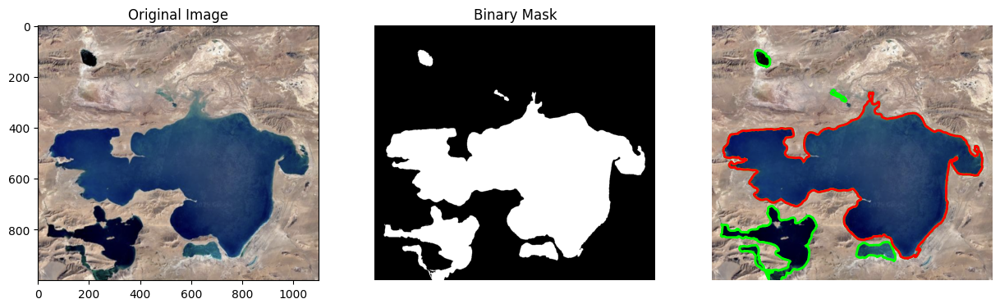

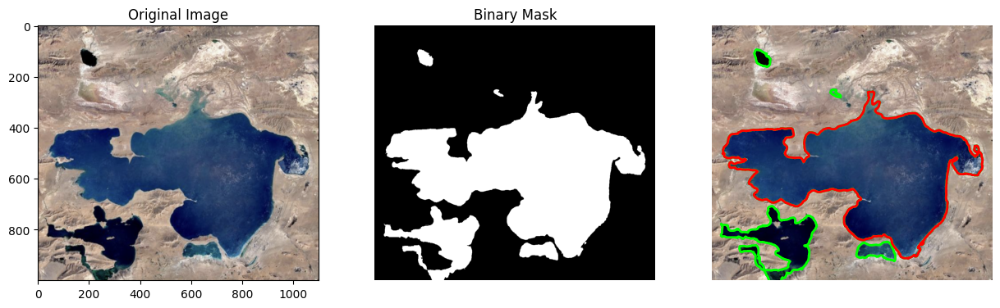

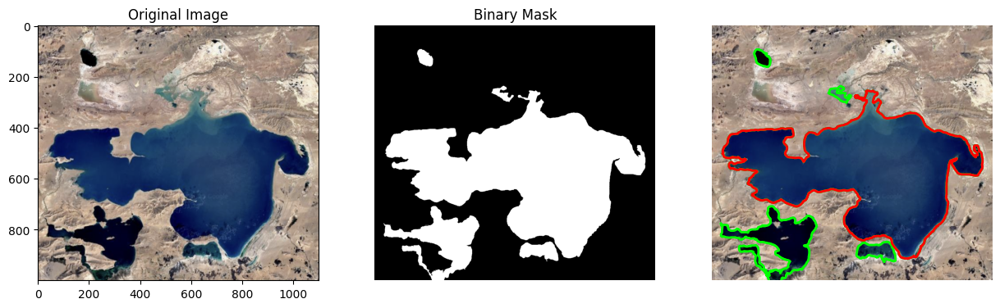

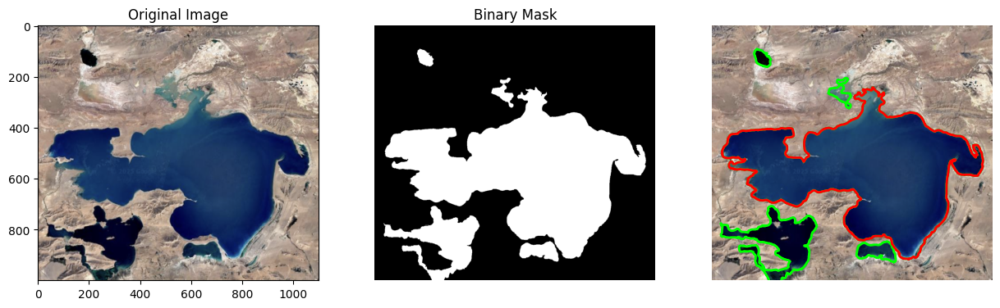

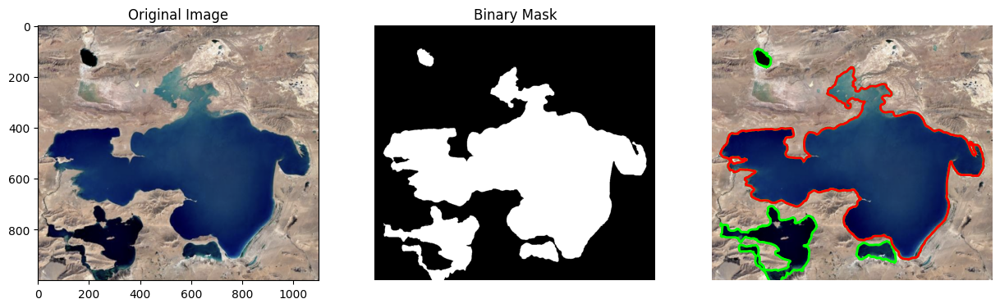

...

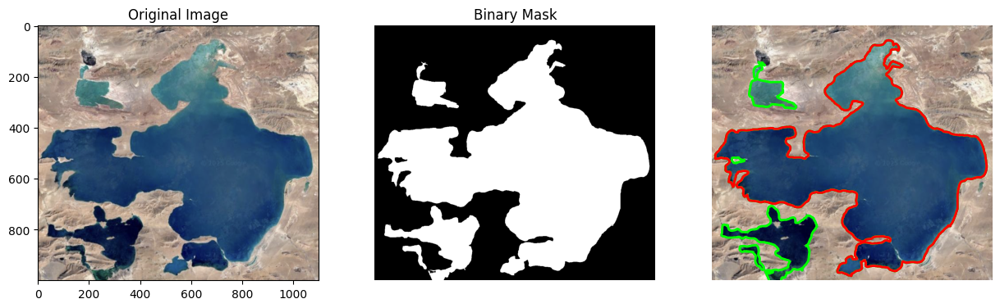

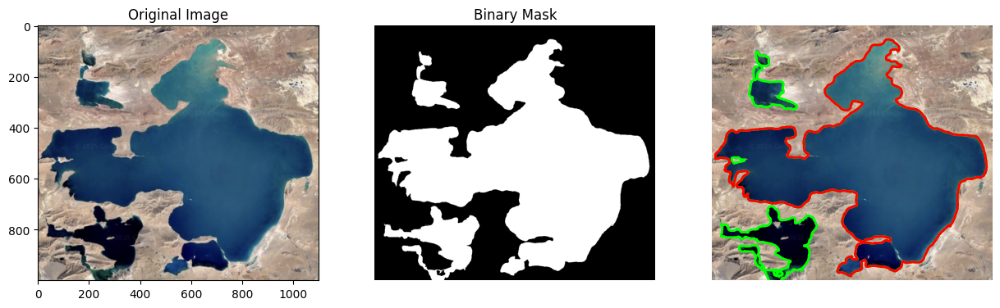

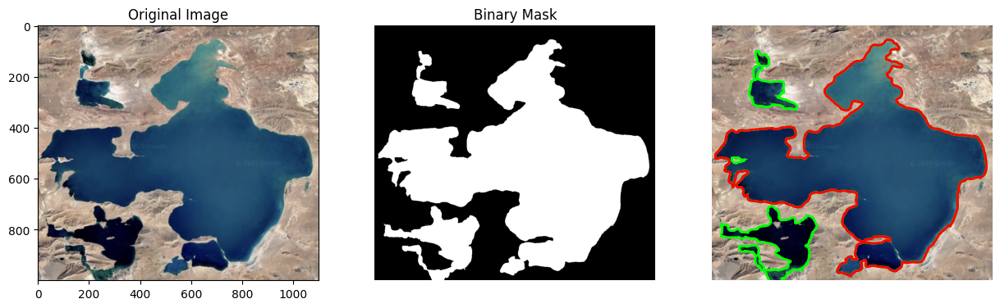

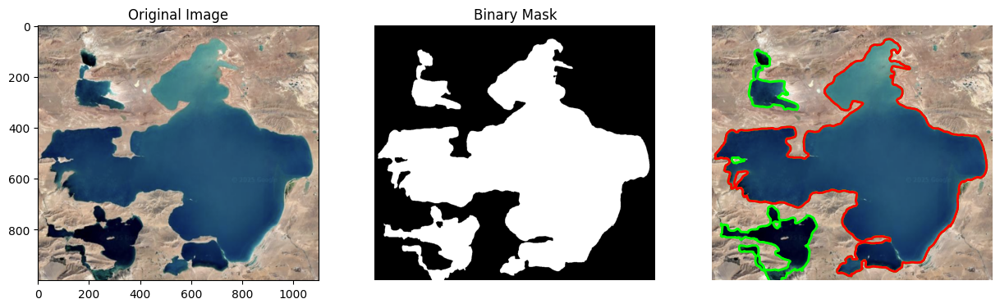

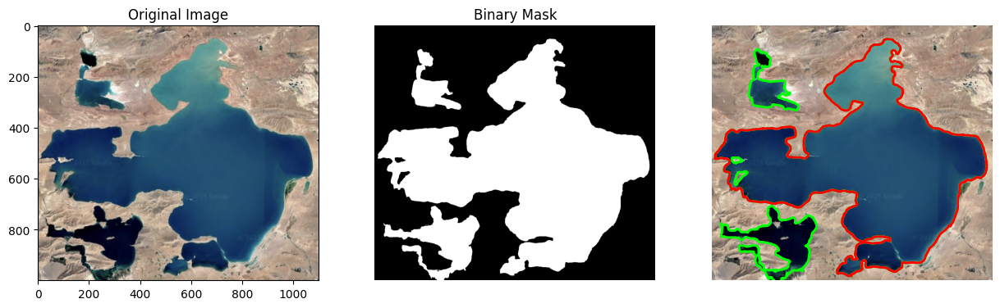

In [18]:
for year in range(1996, 2021):
    img_path = f'SLC/images/SLC_{year}.png'
    mask, _ = extract_contour(img_path, crop_box=(None, 150, 1100, 1150))
    np.save(f'SLC/SLC_mask_{year}.npy', mask)

# Lake Mead

In [26]:
def extract_contour_mead(img_path, crop_box=None):
    img = Image.open(img_path).convert("RGB")
    if crop_box:
        box = (crop_box[0] if crop_box[0] else 0,
               crop_box[1] if crop_box[1] else 0,
               crop_box[2] if crop_box[2] else img.width,
               crop_box[3] if crop_box[3] else img.height)
        img = img.crop(box)
        
    rgb = np.array(img).astype(np.float32) / 255
    r,g,b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    
    brightness = 0.299 * r + 0.587 * g + 0.114 * b
    
    water_mask = (
        (brightness < 0.12) |
        ((b > r + 0.08) & 
        (g > r + 0.05))
    )
    
    closed = morphology.closing(water_mask, morphology.disk(2))
    clean_water = morphology.remove_small_objects(closed, min_size=1000)
    clean_water = morphology.remove_small_holes(clean_water, area_threshold=1000)
    contours = measure.find_contours(clean_water, 0.5)

    _, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(img)
    ax[1].imshow(clean_water, cmap='gray')
    ax[1].axis('off')

    ax[2].imshow(rgb, cmap='gray')
    for c in contours:
        plt.plot(c[:, 1], c[:, 0], color='lime', linewidth=2)
        
    largest_contour = max(contours, key=len)
    ax[2].plot(largest_contour[:, 1], largest_contour[:, 0], color='red', linewidth=2, label='Largest Contour')
    ax[2].axis('off')

    plt.show()
    
    return clean_water, (largest_contour[:, 1], largest_contour[:, 0])  # x, y coordinates of the contour

### save binary masks

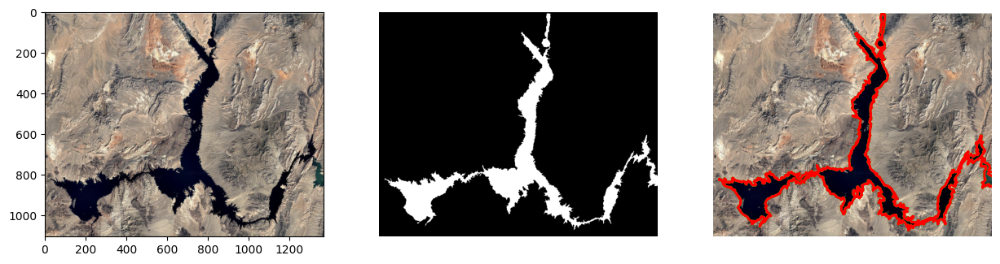

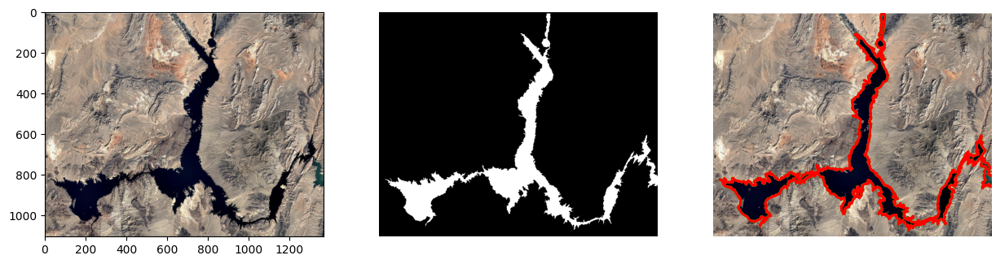

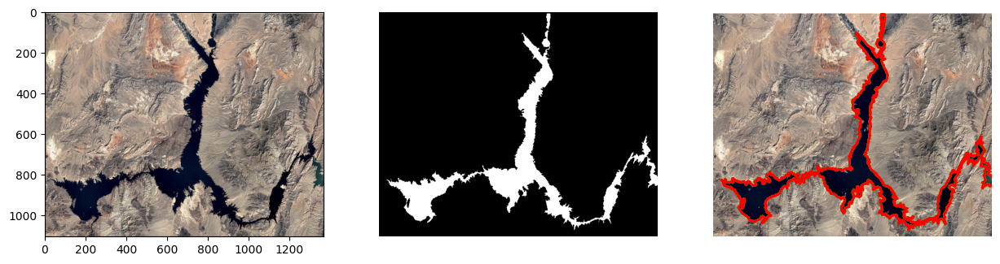

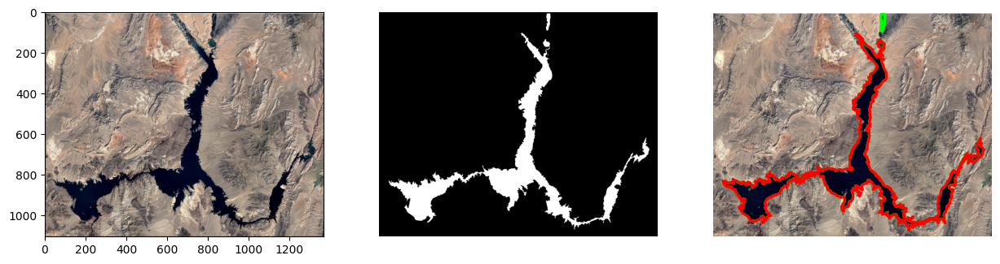

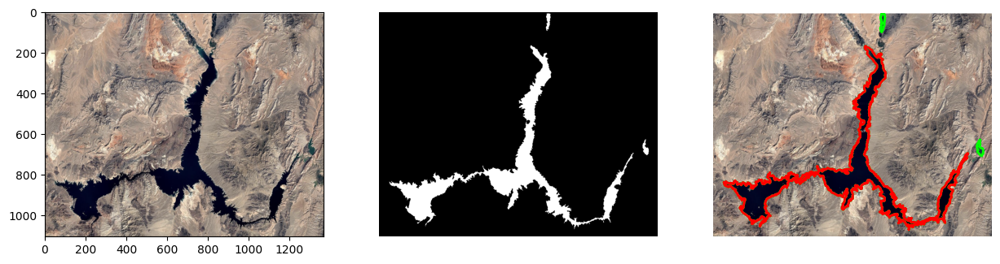

...

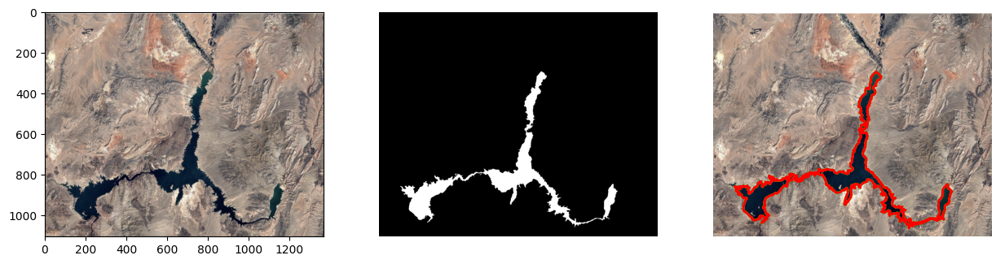

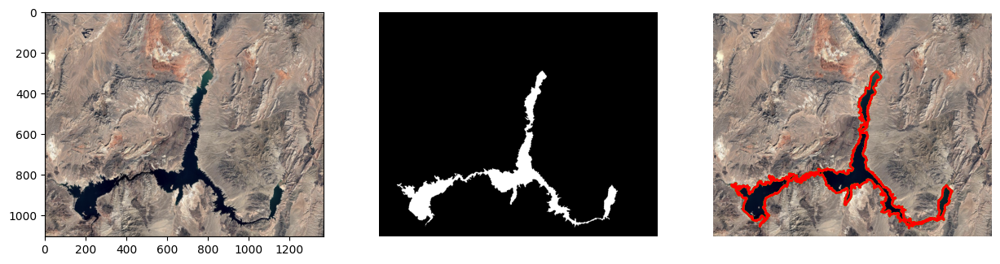

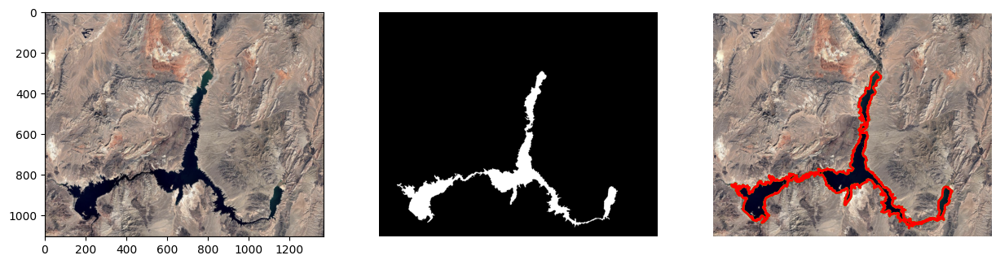

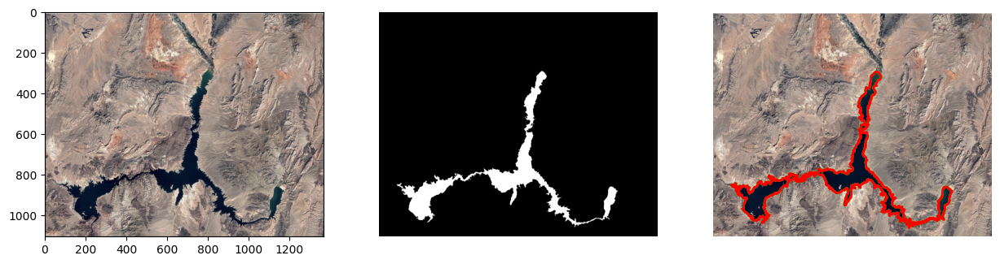

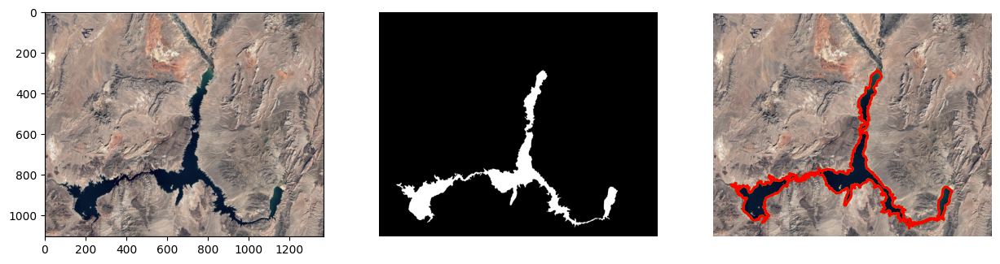

In [29]:
for year in range(1998, 2021):
    filepath = f"MEAD/images/MEAD_{year}.png"
    mask, _ = extract_contour_mead(filepath, crop_box=(None, 100, None, None))
    np.save(f'MEAD/MEAD_mask_{year}.npy', mask)    